In [75]:
from openslide import open_slide
import openslide
from PIL import Image
import numpy as np
from matplotlib import pyplot as plt
%matplotlib inline
%config InlineBackend.figure_format = 'retina'

from tifffile import imread, imsave
from csbdeep.utils import Path, normalize
from csbdeep.utils.tf import keras_import
keras = keras_import()

from stardist import export_imagej_rois, random_label_cmap
from stardist.models import StarDist2D

np.random.seed(0)
cmap = random_label_cmap()

In [5]:
slide = open_slide("D:\Saksham\WSI\JP2K-33003-2.svs")

In [6]:
slide_prop = slide.properties

In [7]:
print(slide_prop)

<_PropertyMap {'aperio.AppMag': '40', 'aperio.DSR ID': 'homer', 'aperio.Date': '07/16/09', 'aperio.Filename': '6811', 'aperio.Filtered': '3', 'aperio.Focus Offset': '-0.001000', 'aperio.ICC Profile': 'ScanScope v1', 'aperio.ImageID': '6811', 'aperio.Left': '44.815720', 'aperio.LineAreaXOffset': '0.000000', 'aperio.LineAreaYOffset': '0.000000', 'aperio.LineCameraSkew': '-0.003035', 'aperio.MPP': '0.2498', 'aperio.OriginalWidth': '34000', 'aperio.Originalheight': '47176', 'aperio.ScanScope ID': 'SS1283', 'aperio.StripeWidth': '1000', 'aperio.Time': '21:59:00', 'aperio.Title': 'univ missouri 07.15.09', 'aperio.Top': '18.114859', 'aperio.User': '93d70f65-3b32-4072-ba6a-bd6785a781be', 'openslide.associated.label.height': '422', 'openslide.associated.label.width': '415', 'openslide.associated.macro.height': '421', 'openslide.associated.macro.width': '1280', 'openslide.associated.thumbnail.height': '768', 'openslide.associated.thumbnail.width': '532', 'openslide.comment': 'Aperio Image Librar

In [9]:
print("Pixel of X in um is:", slide_prop['openslide.mpp-x'])

Pixel of X in um is: 0.24979999999999999


In [10]:
print("Pixel of Y in um is:", slide_prop['openslide.mpp-y'])

Pixel of Y in um is: 0.24979999999999999


In [14]:
slide_dims = slide.dimensions
print(slide_dims)

(32671, 47076)


In [15]:
objective = float(slide.properties[openslide.PROPERTY_NAME_OBJECTIVE_POWER])
print("The objective power is: ",objective)

The objective power is:  40.0


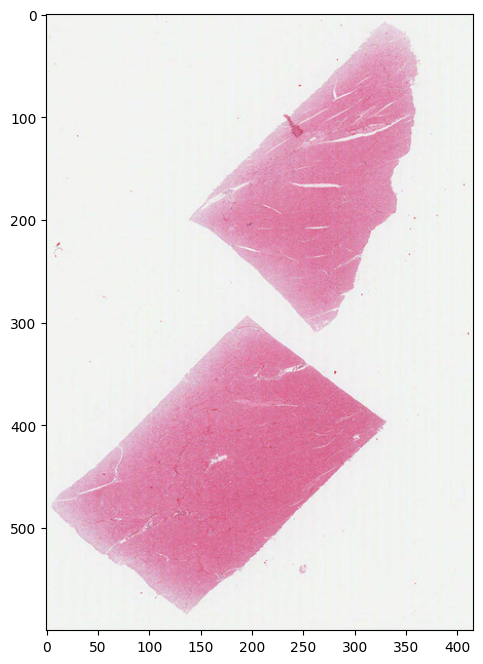

In [17]:
slide_thumb_600 = slide.get_thumbnail(size=(600,600))
slide_thumb_600.show()

slide_thumb_600_np = np.array(slide_thumb_600)
plt.figure(figsize=(8, 8))
plt.imshow(slide_thumb_600_np)

In [18]:
dims = slide.level_dimensions

In [20]:
no_of_levels = len(dims)
print("Number of levels in this image are:", no_of_levels)
print("Dimension of various levels:", dims)

Number of levels in this image are: 3
Dimension of various levels: ((32671, 47076), (8167, 11769), (2041, 2942))


In [24]:
factors = slide.level_downsamples
print("Each level is downsampled by:",  factors)

Each level is downsampled by: (1.0, 4.000183665972818, 16.00435447893306)


In [27]:
level3_dim = dims[2]
level3_img = slide.read_region((0,0), 2, level3_dim)
level3_RGB = level3_img.convert('RGB')
level3_RGB.show()

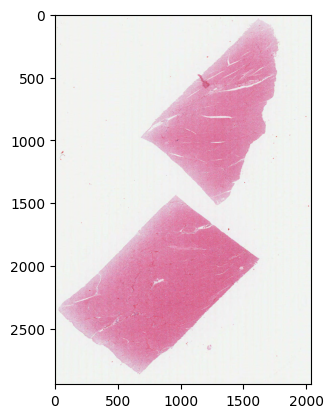

In [28]:
level3_img_np = np.array(level3_RGB)
plt.imshow(level3_img_np)

In [33]:
SCALE_FACTOR = 32
best_level = slide.get_best_level_for_downsample(SCALE_FACTOR)
print(best_level)

2


In [30]:
from openslide.deepzoom import DeepZoomGenerator

In [35]:
tiles = DeepZoomGenerator(slide, tile_size=256, overlap=0, limit_bounds=False)

In [37]:
print("no. of levels in the tiles object:", tiles.level_count)
print("The dimension of data in each level are:", tiles.level_dimensions)
print("Total no. of tiles", tiles.tile_count)

no. of levels in the tiles object: 17
The dimension of data in each level are: ((1, 1), (1, 2), (2, 3), (4, 6), (8, 12), (16, 23), (32, 46), (64, 92), (128, 184), (256, 368), (511, 736), (1021, 1472), (2042, 2943), (4084, 5885), (8168, 11769), (16336, 23538), (32671, 47076))
Total no. of tiles 31417


In [42]:
level_num = 11
print("Tiles shape at level", level_num, tiles.level_tiles[level_num])

Tiles shape at level 11 (4, 6)


In [48]:
tiles_dims = tiles.get_tile_dimensions(11, (3,5))
print(tiles_dims)

(253, 192)


In [54]:
cols, rows = tiles.level_tiles[16]

import os
tile_dir = "D:\Saksham\WSI\Tiles"
for row in range(rows):
    for col in range(cols):
        tiles_name = os.path.join(tile_dir, '%d_%d' % (col,row))
        print("Saving tile with title:", tiles_name)
        temp_tile = tiles.get_tile(16, (col, row))
        temp_tile_rgb = temp_tile.convert('RGB')
        temp_tile_np = np.array(temp_tile_rgb)
        plt.imsave(tiles_name + ".png", temp_tile_np)

Saving tile with title: D:\Saksham\WSI\Tiles\0_0
Saving tile with title: D:\Saksham\WSI\Tiles\1_0
Saving tile with title: D:\Saksham\WSI\Tiles\2_0
Saving tile with title: D:\Saksham\WSI\Tiles\3_0
Saving tile with title: D:\Saksham\WSI\Tiles\4_0
Saving tile with title: D:\Saksham\WSI\Tiles\5_0
Saving tile with title: D:\Saksham\WSI\Tiles\6_0
Saving tile with title: D:\Saksham\WSI\Tiles\7_0
Saving tile with title: D:\Saksham\WSI\Tiles\8_0
Saving tile with title: D:\Saksham\WSI\Tiles\9_0
Saving tile with title: D:\Saksham\WSI\Tiles\10_0
Saving tile with title: D:\Saksham\WSI\Tiles\11_0
Saving tile with title: D:\Saksham\WSI\Tiles\12_0
Saving tile with title: D:\Saksham\WSI\Tiles\13_0
Saving tile with title: D:\Saksham\WSI\Tiles\14_0
Saving tile with title: D:\Saksham\WSI\Tiles\15_0
Saving tile with title: D:\Saksham\WSI\Tiles\16_0
Saving tile with title: D:\Saksham\WSI\Tiles\17_0
Saving tile with title: D:\Saksham\WSI\Tiles\18_0
Saving tile with title: D:\Saksham\WSI\Tiles\19_0
Saving til

In [55]:
import numpy as np
import cv2
from matplotlib import pyplot as plt

In [69]:
############### INPUT RGB IMAGE #######################
#Using opencv to read images may bemore robust compared to using skimage
#but need to remember to convert BGR to RGB.
#Also, convert to float later on and normalize to between 0 and 1.

#Image downloaded from:
#https://pbs.twimg.com/media/C1MkrgQWQAASbdz.jpg
img=cv2.imread("D:\Saksham\WSI\C1MkrgQWQAASbdz.jpg", 1)
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

Io = 240 # Transmitted light intensity, Normalizing factor for image intensities
alpha = 1  #As recommend in the paper. tolerance for the pseudo-min and pseudo-max (default: 1)
beta = 0.15 #As recommended in the paper. OD threshold for transparent pixels (default: 0.15)


def norm_HnE(img, Io=240, alpha=1, beta=0.15):


    ######## Step 1: Convert RGB to OD ###################
    ## reference H&E OD matrix.
    #Can be updated if you know the best values for your image. 
    #Otherwise use the following default values. 
    #Read the above referenced papers on this topic. 
    HERef = np.array([[0.5626, 0.2159],
                      [0.7201, 0.8012],
                      [0.4062, 0.5581]])
    ### reference maximum stain concentrations for H&E
    maxCRef = np.array([1.9705, 1.0308])
    
    
    # extract the height, width and num of channels of image
    h, w, c = img.shape
    
    # reshape image to multiple rows and 3 columns.
    #Num of rows depends on the image size (wxh)
    img = img.reshape((-1,3))
    
    # calculate optical density
    # OD = −log10(I)  
    #OD = -np.log10(img+0.004)  #Use this when reading images with skimage
    #Adding 0.004 just to avoid log of zero. 
    
    OD = -np.log10((img.astype(np.float64) + 1) / Io)  # Use np.float64 instead
    #Use this for opencv imread
    #Add 1 in case any pixels in the image have a value of 0 (log 0 is indeterminate)
    
    
    ############ Step 2: Remove data with OD intensity less than β ############
    # remove transparent pixels (clear region with no tissue)
    ODhat = OD[~np.any(OD < beta, axis=1)] #Returns an array where OD values are above beta
    #Check by printing ODhat.min()
    
    ############# Step 3: Calculate SVD on the OD tuples ######################
    #Estimate covariance matrix of ODhat (transposed)
    # and then compute eigen values & eigenvectors.
    eigvals, eigvecs = np.linalg.eigh(np.cov(ODhat.T))
    
    
    ######## Step 4: Create plane from the SVD directions with two largest values ######
    #project on the plane spanned by the eigenvectors corresponding to the two 
    # largest eigenvalues    
    That = ODhat.dot(eigvecs[:,1:3]) #Dot product
    
    ############### Step 5: Project data onto the plane, and normalize to unit length ###########
    ############## Step 6: Calculate angle of each point wrt the first SVD direction ########
    #find the min and max vectors and project back to OD space
    phi = np.arctan2(That[:,1],That[:,0])
    
    minPhi = np.percentile(phi, alpha)
    maxPhi = np.percentile(phi, 100-alpha)
    
    vMin = eigvecs[:,1:3].dot(np.array([(np.cos(minPhi), np.sin(minPhi))]).T)
    vMax = eigvecs[:,1:3].dot(np.array([(np.cos(maxPhi), np.sin(maxPhi))]).T)
    
    
    # a heuristic to make the vector corresponding to hematoxylin first and the 
    # one corresponding to eosin second
    if vMin[0] > vMax[0]:    
        HE = np.array((vMin[:,0], vMax[:,0])).T
        
    else:
        HE = np.array((vMax[:,0], vMin[:,0])).T
    
    
    # rows correspond to channels (RGB), columns to OD values
    Y = np.reshape(OD, (-1, 3)).T
    
    # determine concentrations of the individual stains
    C = np.linalg.lstsq(HE,Y, rcond=None)[0]
    
    # normalize stain concentrations
    maxC = np.array([np.percentile(C[0,:], 99), np.percentile(C[1,:],99)])
    tmp = np.divide(maxC,maxCRef)
    C2 = np.divide(C,tmp[:, np.newaxis])
    
    ###### Step 8: Convert extreme values back to OD space
    # recreate the normalized image using reference mixing matrix 
    
    Inorm = np.multiply(Io, np.exp(-HERef.dot(C2)))
    Inorm[Inorm>255] = 254
    Inorm = np.reshape(Inorm.T, (h, w, 3)).astype(np.uint8)  
    
    # Separating H and E components
    
    H = np.multiply(Io, np.exp(np.expand_dims(-HERef[:,0], axis=1).dot(np.expand_dims(C2[0,:], axis=0))))
    H[H>255] = 254
    H = np.reshape(H.T, (h, w, 3)).astype(np.uint8)
    
    E = np.multiply(Io, np.exp(np.expand_dims(-HERef[:,1], axis=1).dot(np.expand_dims(C2[1,:], axis=0))))
    E[E>255] = 254
    E = np.reshape(E.T, (h, w, 3)).astype(np.uint8)
    
    return (Inorm, H, E)

# img=cv2.imread('images/HnE_Image.jpg', 1)
# img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

norm_img, H_img, E_img = norm_HnE(img, Io=240, alpha=1, beta=0.15)


plt.imsave("D:\Saksham\WSI\C1MkrgQWQAASbdz.jpg", norm_img)
plt.imsave("D:\Saksham\WSI\H_img.jpg", H_img)
plt.imsave("D:\Saksham\WSI\E_img.jpg", E_img)

In [ ]:
plt.figure(figsize=(12, 12))
plt.subplot(221)
plt.title('Original Image')
plt.imshow(til)
plt.subplot(222)
plt.title('Normalized Image')
plt.imshow(norm_img)
plt.subplot(223)
plt.title('H image')
plt.imshow(H_img)
plt.subplot(224)
plt.title('E image')
plt.imshow(E_img)
plt.show()

In [73]:
def show_image(img, **kwargs):
    """Plot large image at different resolutions."""
    fig, ax = plt.subplots(2,4, figsize=(16,8))
    mid = [s//2 + 600 for s in img.shape[:2]]
    for a,t,u in zip(ax.ravel(),[1,2,4,8,16,32,64,128],[16,8,4,2,1,1,1,1]):
        sl = tuple(slice(c - s//t//2, c + s//t//2, u) for s,c in zip(img.shape[:2],mid))
        a.imshow(img[sl], **kwargs)
        a.axis('off')
    plt.tight_layout()
    plt.show()

In [76]:
img = imread("D:\Saksham\WSI\JP2K-33003-2.svs")
img.shape

(47076, 32671, 3)

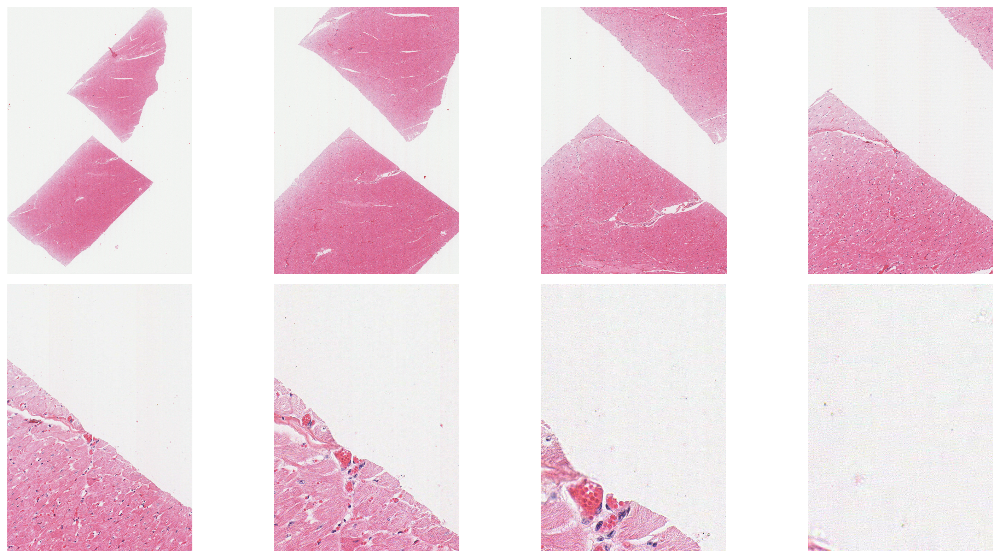

In [77]:
show_image(img)

In [78]:
model = StarDist2D.from_pretrained('2D_versatile_he')

Found model '2D_versatile_he' for 'StarDist2D'.
Loading network weights from 'weights_best.h5'.
Loading thresholds from 'thresholds.json'.
Using default values: prob_thresh=0.692478, nms_thresh=0.3.


In [79]:
from csbdeep.data import Normalizer, normalize_mi_ma

class MyNormalizer(Normalizer):
    def __init__(self, mi, ma):
            self.mi, self.ma = mi, ma
    def before(self, x, axes):
        return normalize_mi_ma(x, self.mi, self.ma, dtype=np.float32)
    def after(*args, **kwargs):
        assert False
    @property
    def do_after(self):
        return False

# mi, ma = np.percentile(img[::8], [1,99.8])                      # compute percentiles from low-resolution image
mi, ma = np.percentile(img[13000:16000,13000:16000], [1,99.8])  # compute percentiles from smaller crop
normalizer = MyNormalizer(mi, ma)

In [80]:
help(model.predict_instances_big)

Help on method predict_instances_big in module stardist.models.base:

predict_instances_big(img, axes, block_size, min_overlap, context=None, labels_out=None, labels_out_dtype=<class 'numpy.int32'>, show_progress=True, **kwargs) method of stardist.models.model2d.StarDist2D instance
    Predict instance segmentation from very large input images.
    
    Intended to be used when `predict_instances` cannot be used due to memory limitations.
    This function will break the input image into blocks and process them individually
    via `predict_instances` and assemble all the partial results. If used as intended, the result
    should be the same as if `predict_instances` was used directly on the whole image.
    
    **Important**: The crucial assumption is that all predicted object instances are smaller than
                   the provided `min_overlap`. Also, it must hold that: min_overlap + 2*context < block_size.
    
    Example
    -------
    >>> img.shape
    (20000, 20000)
    >>

In [81]:
labels, polys = model.predict_instances_big(img, axes='YXC', block_size=4096, min_overlap=128, context=128,
                                            normalizer=normalizer, n_tiles=(4,4,1))

effective: block_size=(4096, 4096, 3), min_overlap=(128, 128, 0), context=(128, 128, 0)


100%|████████████████████████████████████████████████████████████████████████████████| 117/117 [07:03<00:00,  3.62s/it]


In [82]:
from skimage.measure import regionprops_table
import pandas as pd

props = regionprops_table(labels, img, 
                          properties=['label',
                                      'area', 'equivalent_diameter',
                                      'mean_intensity', 'solidity'])

       label   area  equivalent_diameter  mean_intensity-0  mean_intensity-1  \
28211  28212  197.0            15.837556        119.309645         87.071066   
28212  28213  506.0            25.382262        166.027668        126.470356   
28213  28214  346.0            20.989066        125.335260         82.910405   
28214  28215   89.0            10.645108        127.516854        137.764045   
28215  28216  555.0            26.582851         89.331532         95.526126   

       mean_intensity-2  solidity  
28211        135.446701  0.912037  
28212        169.286561  0.944030  
28213        133.416185  0.930108  
28214        138.741573  0.967391  
28215         97.531532  0.953608  


<Axes: xlabel='area', ylabel='Count'>

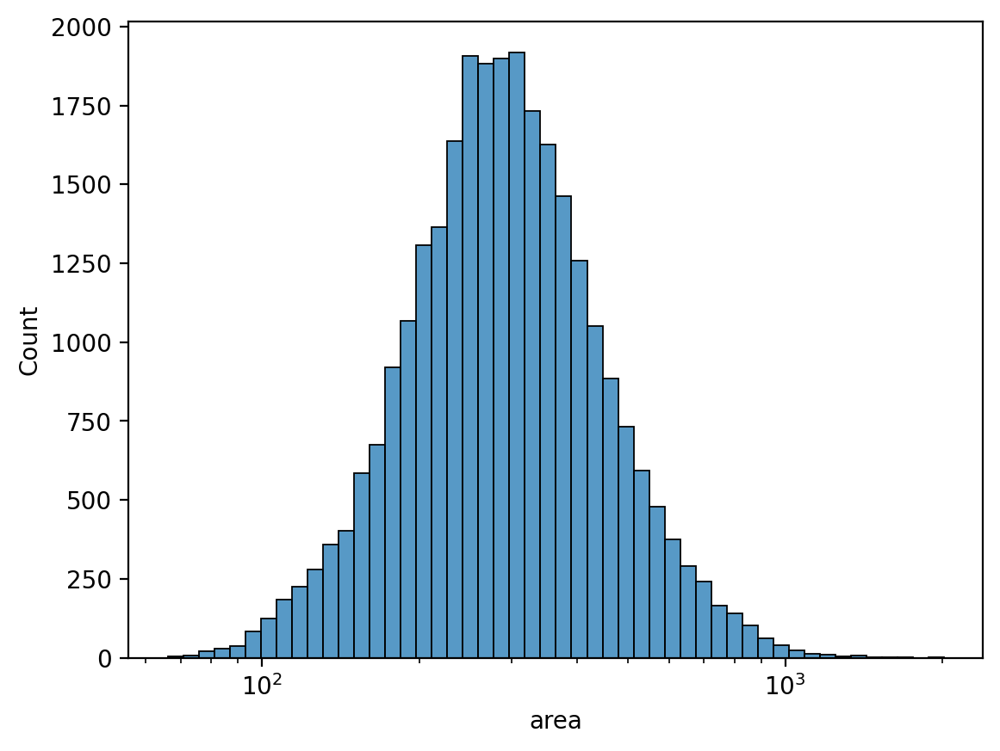

In [84]:
import seaborn as sns
analysis_results = pd.DataFrame(props)
print(analysis_results.tail())
sns.histplot(x="area", data=analysis_results, bins=50, log_scale=True)